In [1]:
# Packages necessary for this notebook
import numpy             as np
import pandas            as pd
import xarray            as xr
import seaborn           as sns
import cartopy.crs       as crs
import cartopy.feature   as cfeature
import matplotlib
import matplotlib.pyplot as plt

C:\ProgramData\Anaconda3\lib\site-packages\dask\config.py:168: YAMLLoadWarning: calling yaml.load() without Loader=... is deprecated, as the default Loader is unsafe. Please read https://msg.pyyaml.org/load for full details.
  data = yaml.load(f.read()) or {}
C:\ProgramData\Anaconda3\lib\site-packages\distributed\config.py:20: YAMLLoadWarning: calling yaml.load() without Loader=... is deprecated, as the default Loader is unsafe. Please read https://msg.pyyaml.org/load for full details.
  defaults = yaml.load(f)


In [2]:
# Import the NOAA data from 1981-2019
NOAA = xr.open_dataset(r'D:\CRI_Modelling_PC\Netcdf Data\NOAA\sst.day.mean.PacCst.1981-2019.nc')

In [3]:
# Put in your temperature ranges here:
# All temperatures in Celcius
min_Temp = 8
max_Temp = 18

min_Temp1 = 12
max_Temp1 = 20

In [4]:
# Get lat and lon data
lat = NOAA.lat.data
lon = NOAA.lon.data

In [5]:
# Constrain data to 1982 - 2018
NOAA_years = np.where((pd.DatetimeIndex(NOAA.time.data).year>=1982) & (pd.DatetimeIndex(NOAA.time.data).year<=2018))
NOAA_short = NOAA.sst[(NOAA_years[0]),:,:]

In [6]:
# Create a mask for land, count the days, and average them over years
NOAA_Mask  = NOAA.sst.where(NOAA.sst.isnull(), 1)
NOAA_Count = NOAA_short.where((NOAA_short <= max_Temp) & (NOAA_short >= min_Temp)).groupby('time.year').count(dim='time')
count_Mean = NOAA_Count.mean(dim="year")
NOAA_Final = count_Mean*NOAA_Mask[0,:,:]

NOAA_Count1 = NOAA_short.where((NOAA_short <= max_Temp1) & (NOAA_short >= min_Temp1)).groupby('time.year').count(dim='time')
count_Mean1 = NOAA_Count1.mean(dim="year")
NOAA_Final1 = count_Mean1*NOAA_Mask[0,:,:]

In [7]:
# Standard deviation data. We might change this, but for now this works
std_Dev = NOAA_Count.std(dim="year")*NOAA_Mask[0,:,:]

In [8]:
# Just for getting state lines 
states_provinces = cfeature.NaturalEarthFeature(
        category='cultural',
        name='admin_1_states_provinces_lines',
        scale='50m',
        facecolor='none')

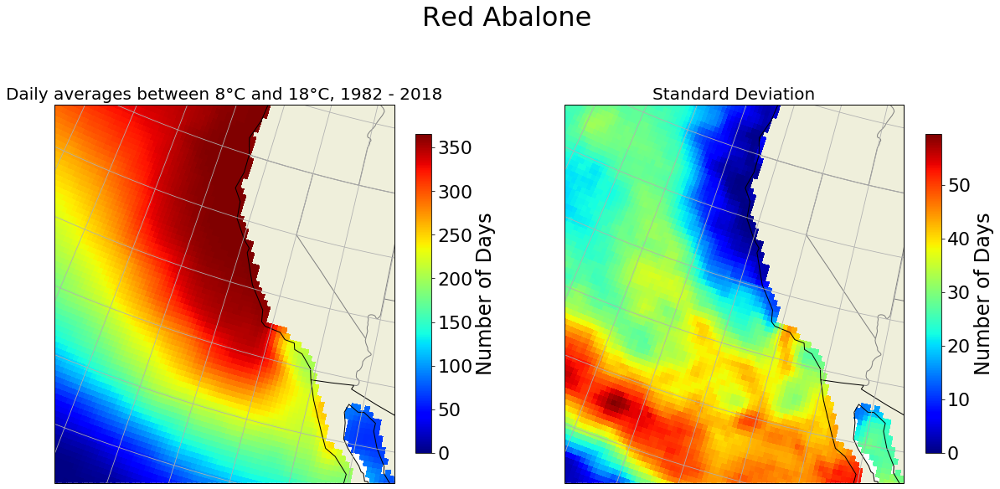

In [9]:
# Creating a figure, change name to species name
fig = plt.figure(figsize=[20,10])
fig.suptitle('Red Abalone',fontsize=32)

# Plot the count_Mean data
NOAA_Plot = fig.add_subplot(1,2,1,projection=crs.LambertConformal())
NOAA_Plot.set_title('Daily averages between ' + str(min_Temp) + '\u00b0C and ' + str(max_Temp) + '\u00b0C, 1982 - 2018', fontsize=20)
NOAA_Plot.set_extent([230,245,28,43], crs.Geodetic())
NOAA_Colormesh = NOAA_Plot.pcolormesh(lon, lat, NOAA_Final.data,
             transform=crs.PlateCarree(),
             cmap='jet',vmax=365)
NOAA_Plot.add_feature(cfeature.COASTLINE)
NOAA_Plot.add_feature(cfeature.LAND)
NOAA_Plot.add_feature(cfeature.BORDERS)
NOAA_Plot.add_feature(states_provinces, edgecolor='gray')
NOAA_Plot.gridlines()

# Create a colorbar
colorbar = fig.colorbar(NOAA_Colormesh, shrink=0.7, anchor=('SW'))
colorbar.set_label('Number of Days',fontsize=24)
colorbar.ax.tick_params(labelsize=22)

# Plot the std_Dev data
std_Plot = fig.add_subplot(1,2,2,projection=crs.LambertConformal())
std_Plot.set_title('Standard Deviation', fontsize=20)
std_Plot.set_extent([230,245,28,43], crs.Geodetic())
std_Colormesh = std_Plot.pcolormesh(lon, lat, std_Dev.data,
             transform=crs.PlateCarree(),
             cmap='jet')
std_Plot.add_feature(cfeature.COASTLINE)
std_Plot.add_feature(cfeature.LAND)
std_Plot.add_feature(cfeature.BORDERS)
std_Plot.add_feature(states_provinces, edgecolor='gray')
std_Plot.gridlines()

# A new colorbar
colorbar2 = fig.colorbar(std_Colormesh, shrink=0.7, anchor=('SW'))
colorbar2.set_label('Number of Days',fontsize=24)
colorbar2.ax.tick_params(labelsize=22)

# Replace "add_name_here" with the name of your species, this will save the graph to the computer so we can have it
# for Gaby's PowerPoint
fig.savefig(r"D:\CRI_Modelling_PC\CRI Maps\red abalone.jpeg", bbox_inches='tight')

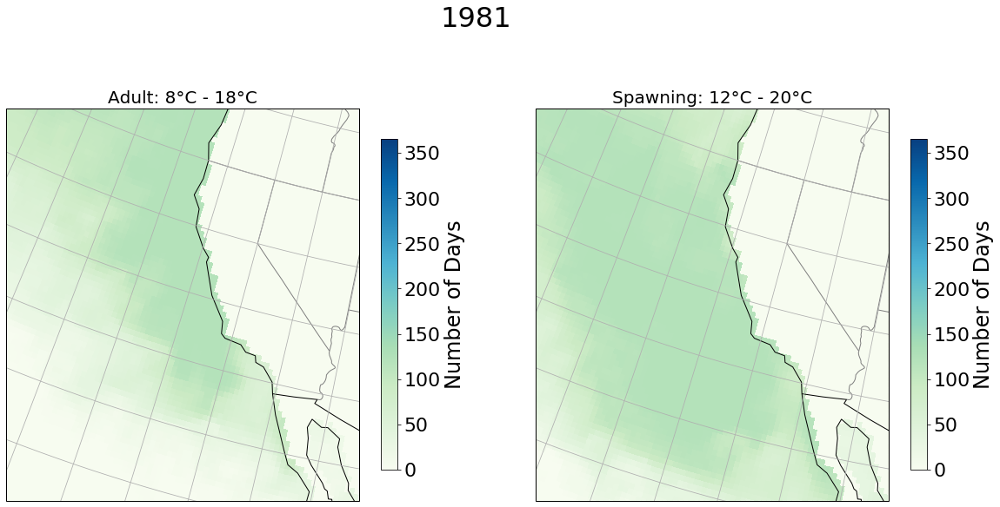

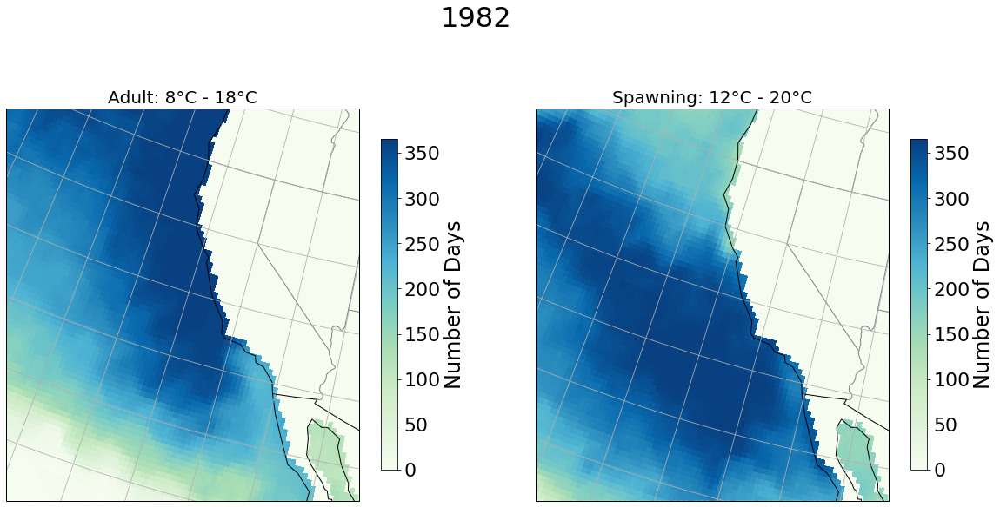

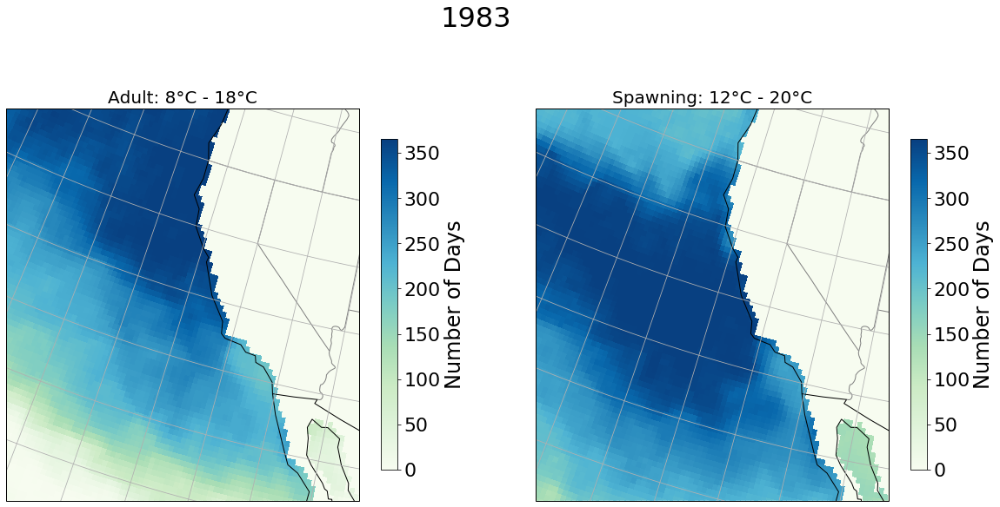

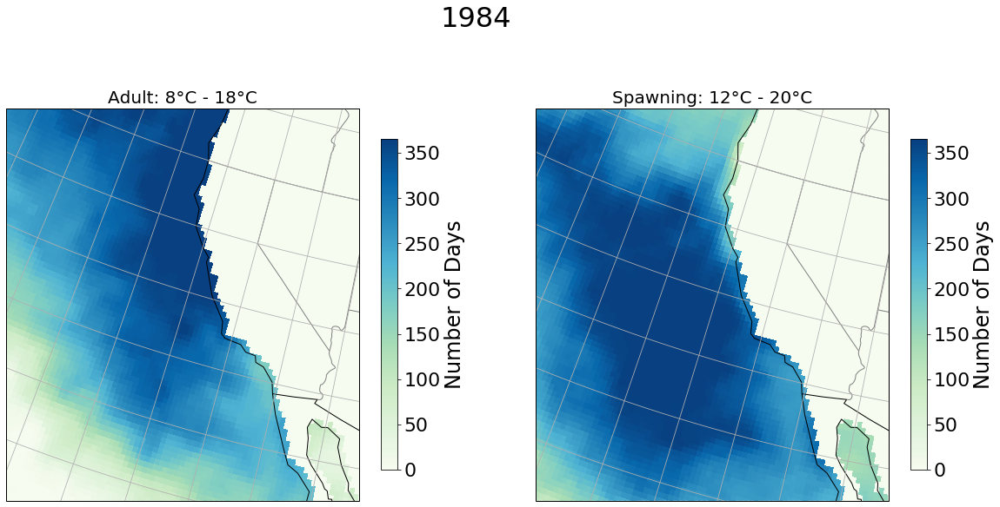

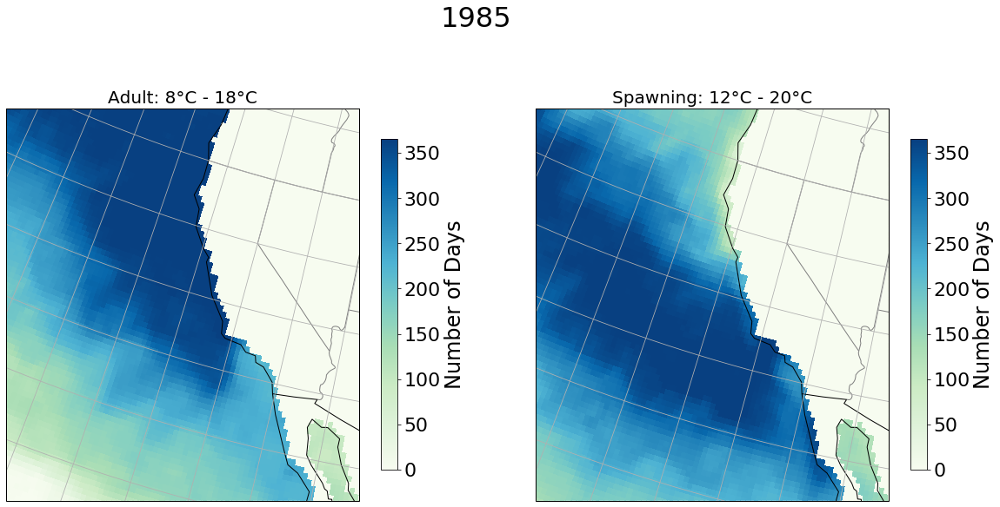

...

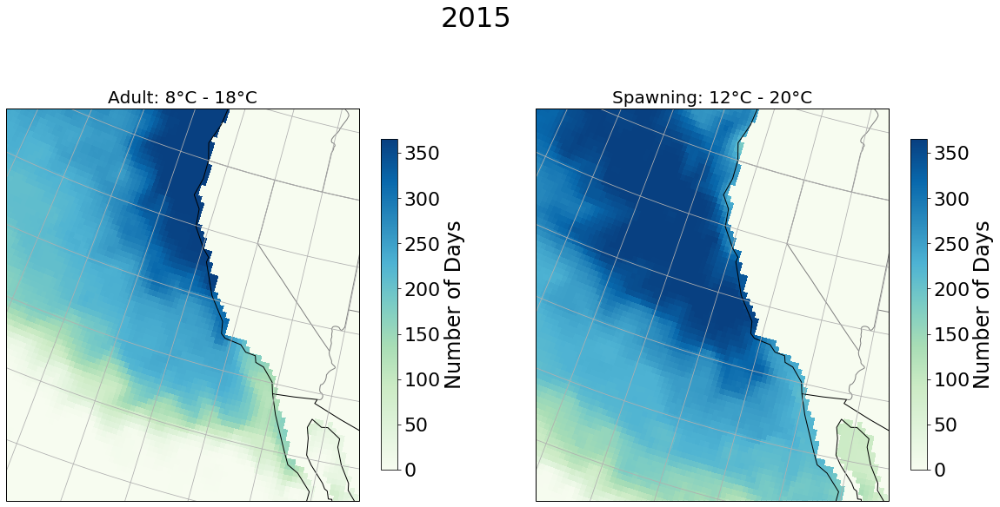

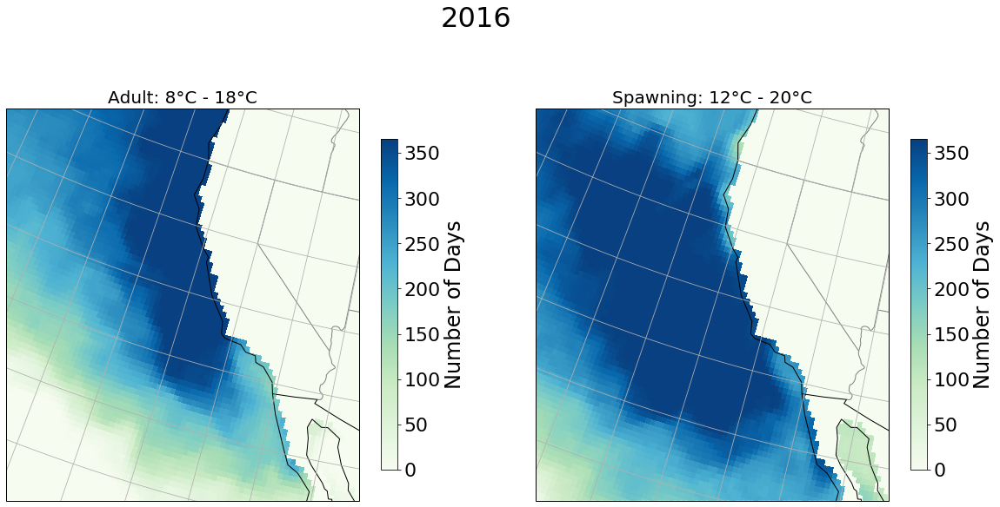

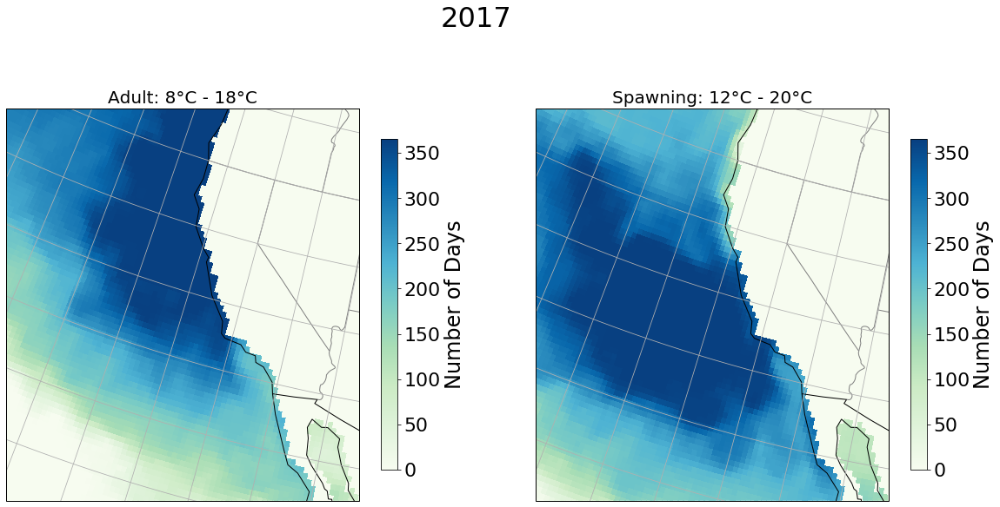

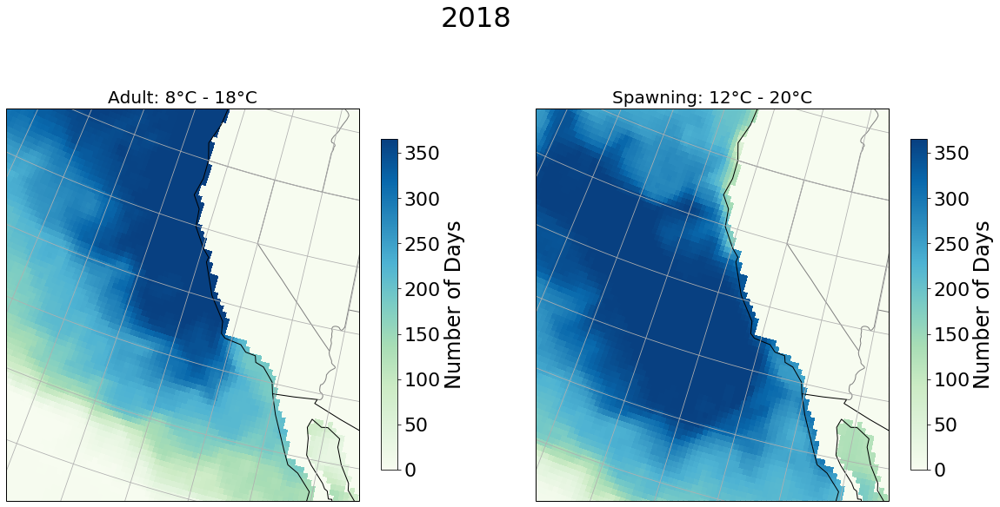

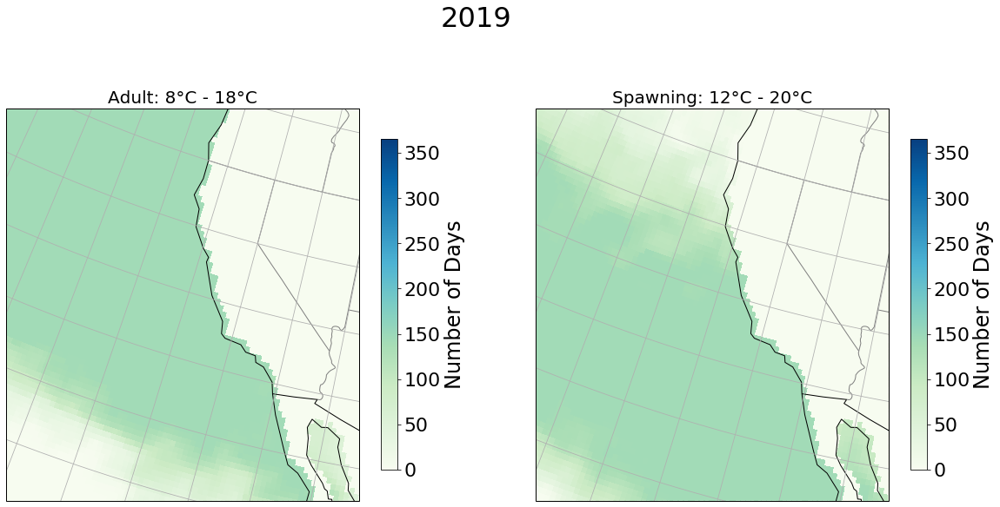

In [30]:
for ii in range(len(NOAA_Count.sst)):
    #print(ii*NOAA_Mask[0,:,:])
    fig = plt.figure(figsize=[20,10])
    fig.suptitle(NOAA_Count.sst[ii].year.data,fontsize=32)

    # Plot the count_Mean data
    NOAA_Plot = fig.add_subplot(1,2,1,projection=crs.LambertConformal())
    NOAA_Plot.set_title('Adult: ' + str(min_Temp) + '\u00b0C - ' + str(max_Temp) + '\u00b0C', fontsize=20)
    NOAA_Plot.set_extent([230,245,28,43], crs.Geodetic())
    NOAA_Colormesh = NOAA_Plot.pcolormesh(lon, lat, NOAA_Count.sst[ii].data,
                 transform=crs.PlateCarree(),
                 cmap='GnBu',vmax=365,vmin=0)
    NOAA_Plot.add_feature(cfeature.COASTLINE)
    NOAA_Plot.add_feature(cfeature.LAND)
    NOAA_Plot.add_feature(cfeature.BORDERS)
    NOAA_Plot.add_feature(states_provinces, edgecolor='gray')
    NOAA_Plot.gridlines()
    
    colorbar1 = fig.colorbar(NOAA_Colormesh, shrink=0.7, anchor=('SW'))
    colorbar1.set_label('Number of Days',fontsize=24)
    colorbar1.ax.tick_params(labelsize=22)
    
    NOAA_Plot2 = fig.add_subplot(1,2,2,projection=crs.LambertConformal())
    NOAA_Plot2.set_title('Spawning: ' + str(min_Temp1) + '\u00b0C - ' + str(max_Temp1) + '\u00b0C', fontsize=20)
    NOAA_Plot2.set_extent([230,245,28,43], crs.Geodetic())
    NOAA_Colormesh2 = NOAA_Plot2.pcolormesh(lon, lat, NOAA_Count1.sst[ii].data,
                 transform=crs.PlateCarree(),
                 cmap='GnBu',vmax=365,vmin=0)
    NOAA_Plot2.add_feature(cfeature.COASTLINE)
    NOAA_Plot2.add_feature(cfeature.LAND)
    NOAA_Plot2.add_feature(cfeature.BORDERS)
    NOAA_Plot2.add_feature(states_provinces, edgecolor='gray')
    NOAA_Plot2.gridlines() 

    # Create a colorbar
    colorbar2 = fig.colorbar(NOAA_Colormesh2, shrink=0.7, anchor=('SW'))
    colorbar2.set_label('Number of Days',fontsize=24)
    colorbar2.ax.tick_params(labelsize=22)
    
    fig.savefig(r"D:\CRI_Modelling_PC\CRI Maps\Abalone gif\ "+str(NOAA_Count.sst[ii].year.data)+".tif", bbox_inches='tight')
    

In [22]:
NOAA_Count1.sst[38]

<xarray.DataArray 'sst' (lat: 200, lon: 240)>
array([[0, 0, 0, ..., 0, 0, 0],
       [0, 0, 0, ..., 0, 0, 0],
       [0, 0, 0, ..., 0, 0, 0],
       ...,
       [0, 0, 0, ..., 0, 0, 0],
       [0, 0, 0, ..., 0, 0, 0],
       [0, 0, 0, ..., 0, 0, 0]])
Coordinates:
  * lon      (lon) float32 210.125 210.375 210.625 ... 269.375 269.625 269.875
  * lat      (lat) float32 10.125 10.375 10.625 10.875 ... 59.375 59.625 59.875
    year     int64 2019